In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn import model_selection
from sklearn.compose import ColumnTransformer
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
import warnings
from sklearn.metrics import confusion_matrix
from sklearn.datasets import make_classification
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Input, Dropout,BatchNormalization
from keras.wrappers.scikit_learn import KerasClassifier
import random
from keras import backend
random.seed(1)
np.random.seed(1) 
tf.random.set_seed(1)
warnings.filterwarnings("ignore")


In [2]:
bank_data = pd.read_csv('./Churn.csv')

bank_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


We have a dataframe with 3 unnecessary features (RowNumber, CustomerID, Surname). No values are missing.

In [3]:
bank_data.drop(columns=['RowNumber','CustomerId','Surname'], inplace=True)
bank_data.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


Changing the relevant object variables and booleans to categoricals.

In [4]:
for col in bank_data.columns:
    if bank_data[col].nunique() == 2 or bank_data[col].dtype == 'object':
        bank_data[col] = bank_data[col].astype('category')

In [5]:
bank_data.describe().T

,count,mean,std,min,25%,50%,75%,max
CreditScore,10000.0,650.528800,96.653299,350.00,584.00,652.000,718.0000,850.00
Age,10000.0,38.921800,10.487806,18.00,32.00,37.000,44.0000,92.00
Tenure,10000.0,5.012800,2.892174,0.00,3.00,5.000,7.0000,10.00
Balance,10000.0,76485.889288,62397.405202,0.00,0.00,97198.540,127644.2400,250898.09
NumOfProducts,10000.0,1.530200,0.581654,1.00,1.00,1.000,2.0000,4.00
EstimatedSalary,10000.0,100090.239881,57510.492818,11.58,51002.11,100193.915,149388.2475,199992.48


Most variables show to be normally distributed, with the exception of the variable Balance which is left skewed.

In [6]:
bank_data.describe(include='category').T

,count,unique,top,freq
Geography,10000,3,France,5014
Gender,10000,2,Male,5457
HasCrCard,10000,2,1,7055
IsActiveMember,10000,2,1,5151
Exited,10000,2,0,7963


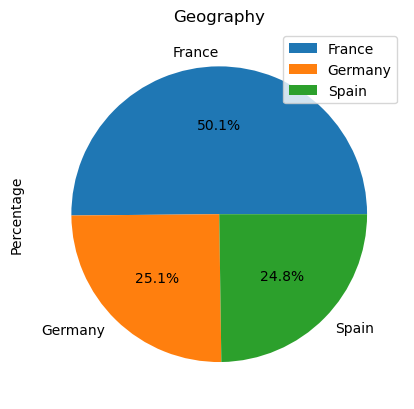

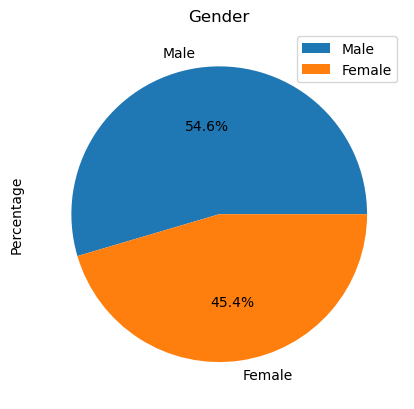

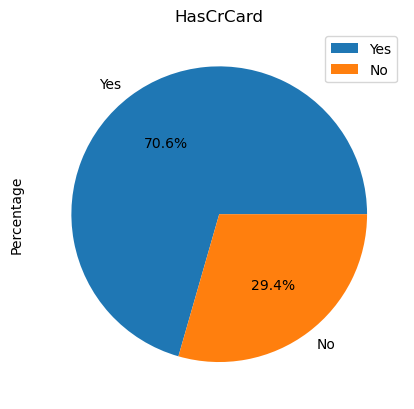

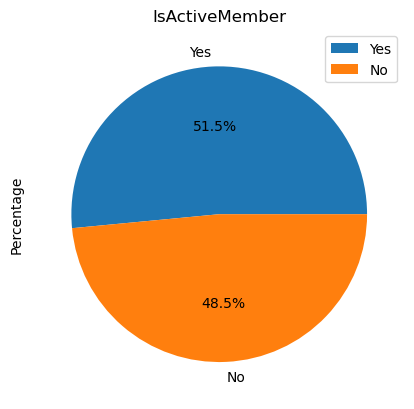

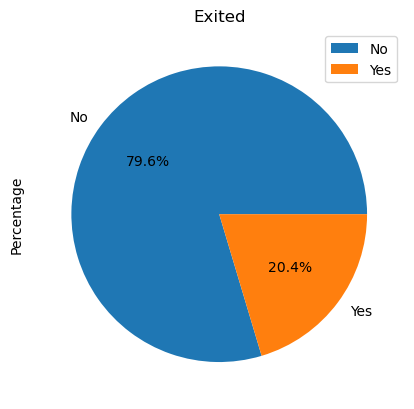

In [7]:
def MakePie(df,col):
    # create a Pandas DataFrame
    doi = df[col].value_counts()
    if doi.index.isin([0, 1]).all():
        doi.index = doi.index.map({0: 'No', 1: 'Yes', 2: 'Other'})
    data = {'category': doi.index,
            'Percentage': doi.unique() / len(df)}
    df = pd.DataFrame(data)

    # create a pie chart of the 'value' column
    df.plot(kind='pie', y='Percentage', labels=df['category'], autopct='%1.1f%%')
    plt.title(col)

    # display the chart
    plt.show()

for i in bank_data.select_dtypes(include = 'category').columns:
    MakePie(bank_data,i)

### Comments:
- We see that a half of the costumers are from France, with the two remaining quarters are from Spain and Germany
- The customers are almost evenly distributed between the two genders
- +70% of customers have a credit card
- Active and non-active members are distributed fairly evenly
- Only around 20% of customers have exited.

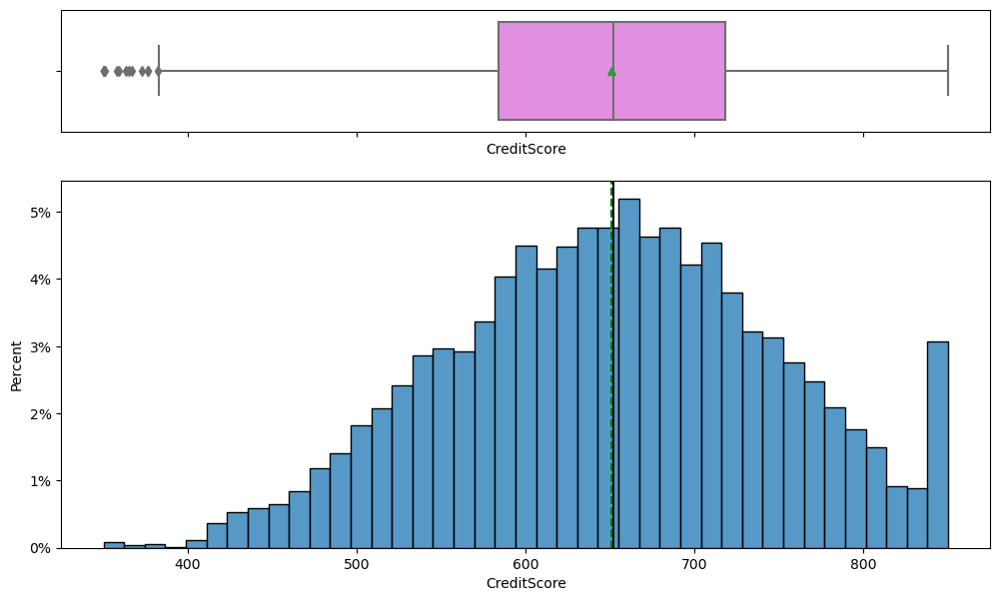

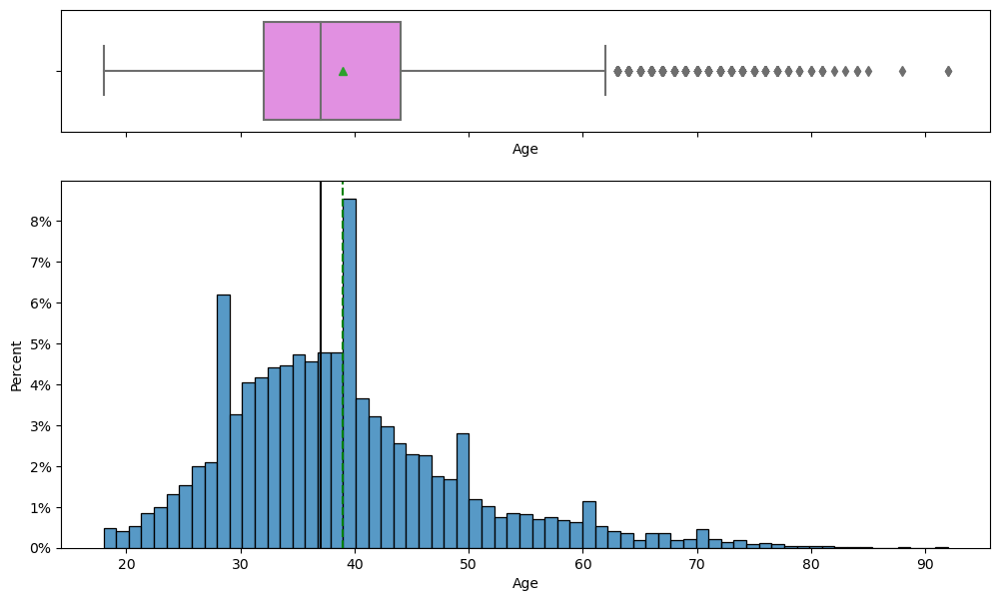

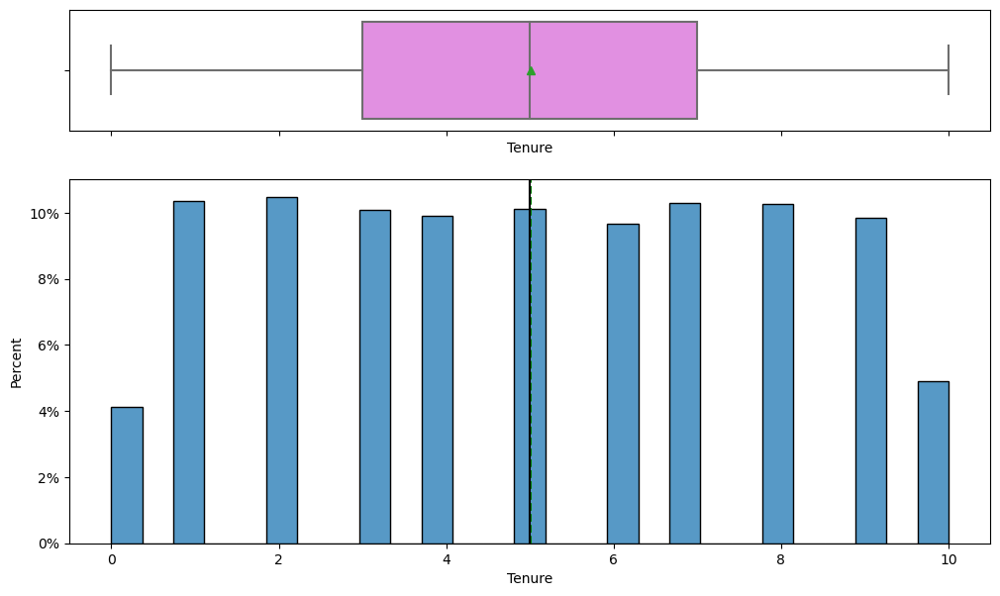

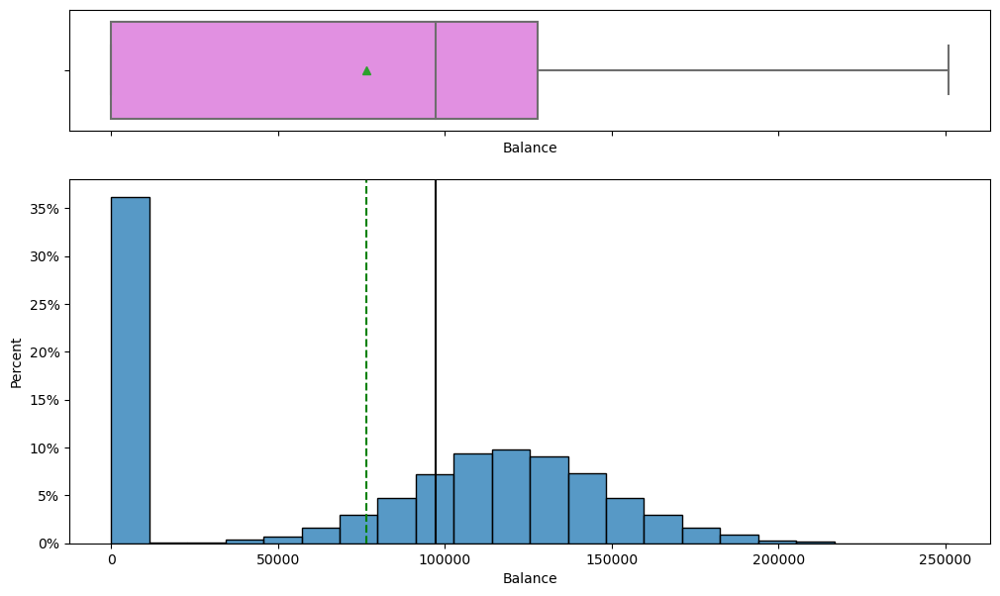

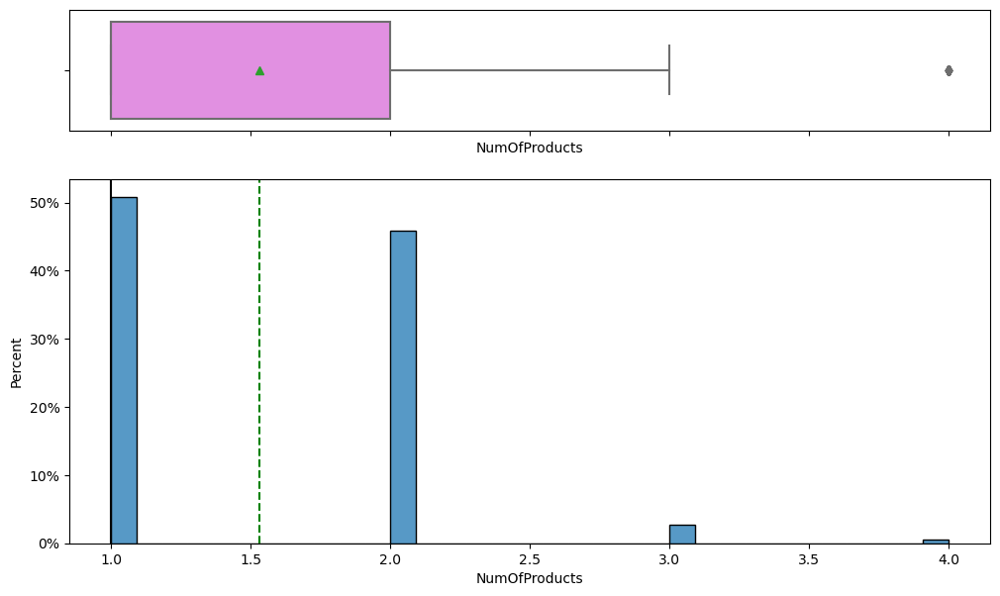

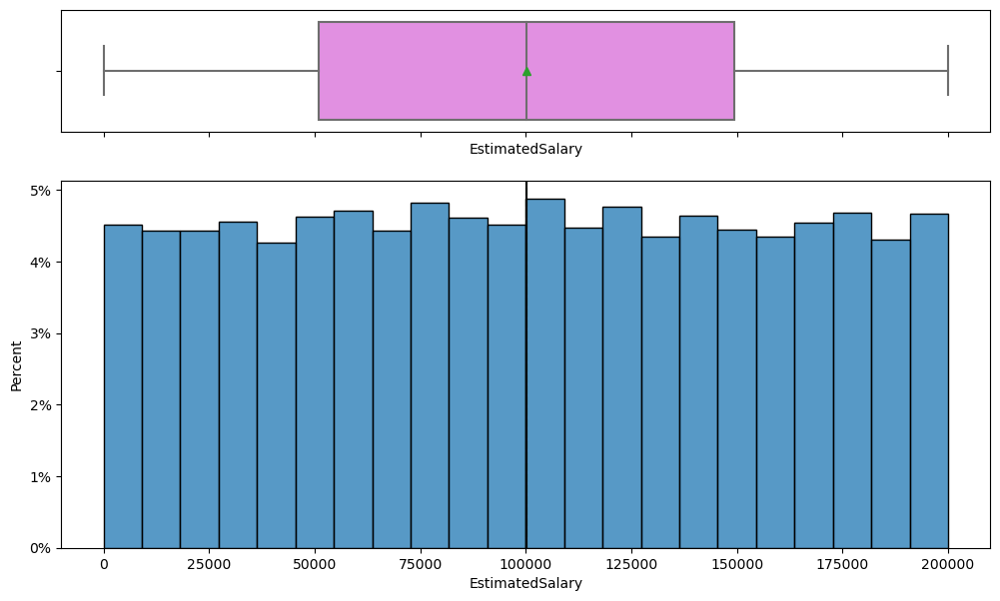

In [8]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    # define a formatter function to format the ticks as percentages
    def percent_formatter(x, pos):
        return '{:.0f}%'.format(x)

    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter", stat='percent'
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, stat='percent'
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram
    ax_hist2.yaxis.set_major_formatter(FuncFormatter(percent_formatter))

for i in bank_data.select_dtypes(include=np.number).columns:
    histogram_boxplot(bank_data, i)

### Comments:
- The average credit score is 650, with a clear peak at a max credit score
- The mean of the customers are around late thirties in age
- Customers are pretty evenly distributed around the different years of tenure
- For customers that carry balances, it seems to be normally distributed around 125000. However, 35% of customers don't carry any balance over
- +90% of customers only have either 1 or 2 products
- Customers have a uniform distribution in terms of salary

## Bivariate analysis

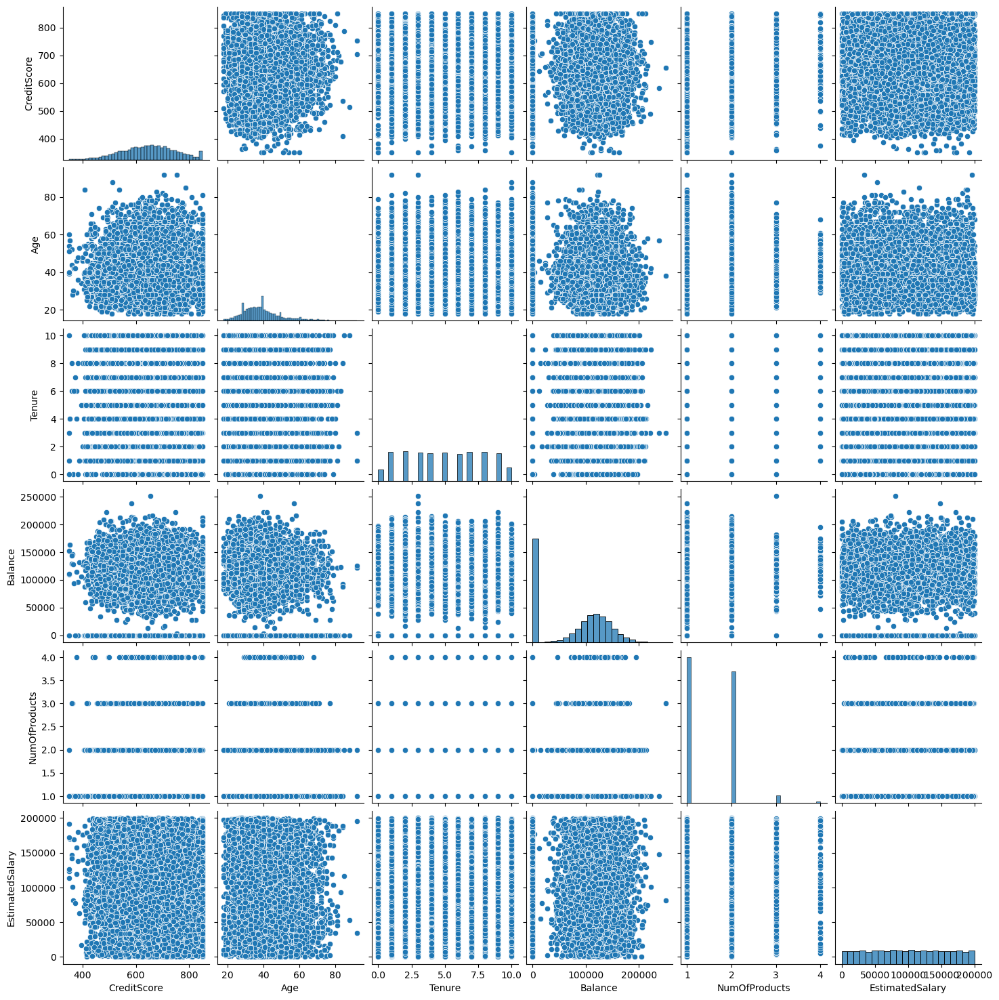

In [9]:
sns.pairplot(bank_data.select_dtypes(include=np.number))

There is little information on distribution from these pairplots. We can possibly obtain more information by trying to cluster the pairplots by the categorical variables:

Pairplots separating for the variable:  Geography


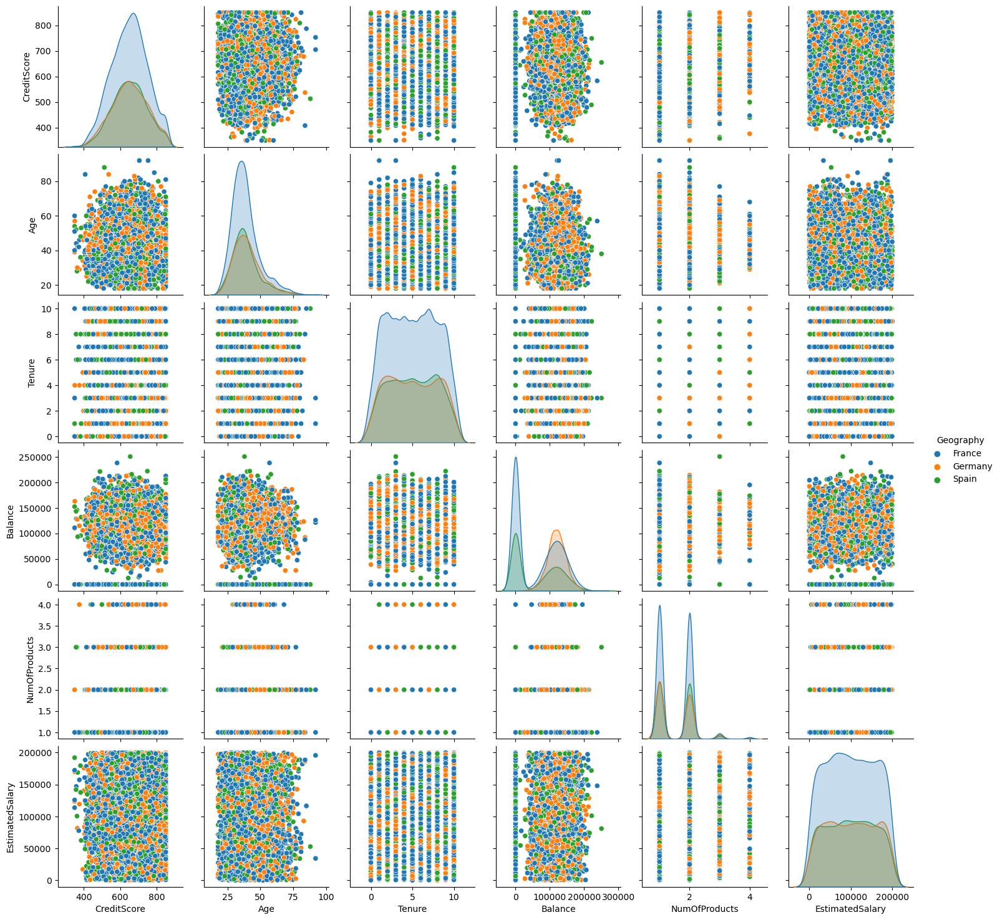

Pairplots separating for the variable:  Gender


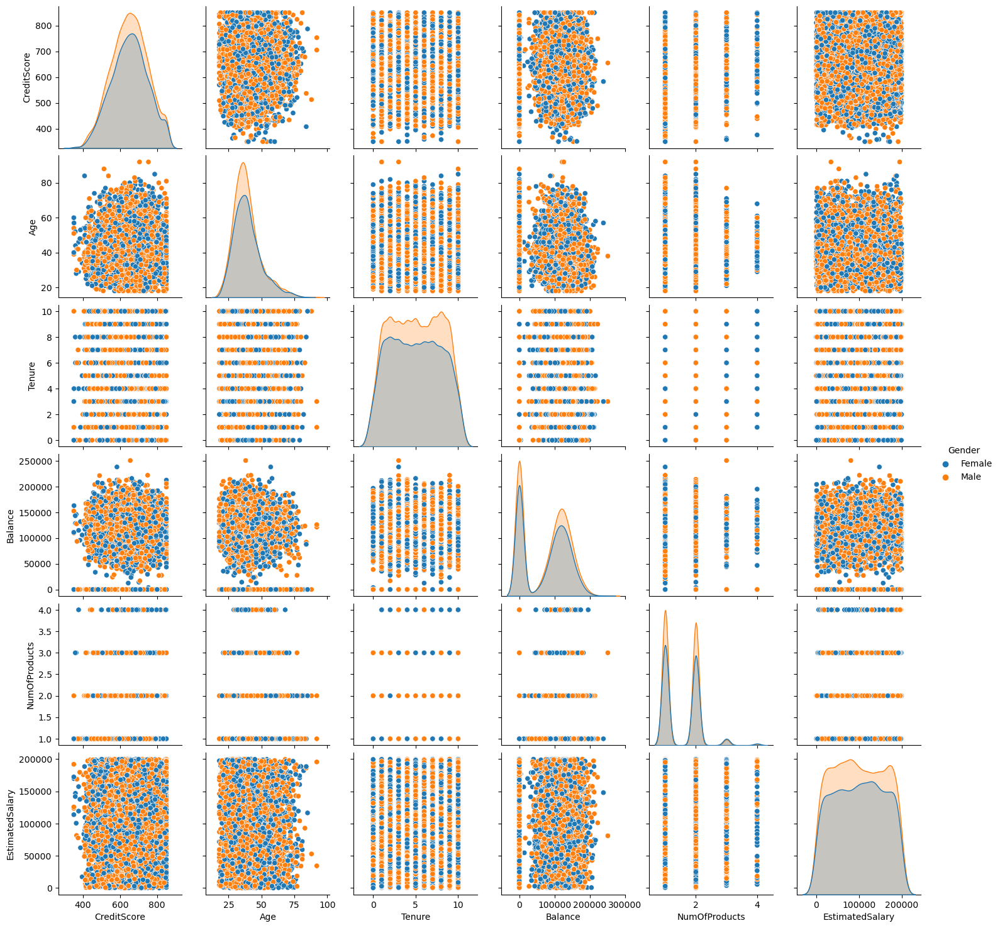

Pairplots separating for the variable:  HasCrCard


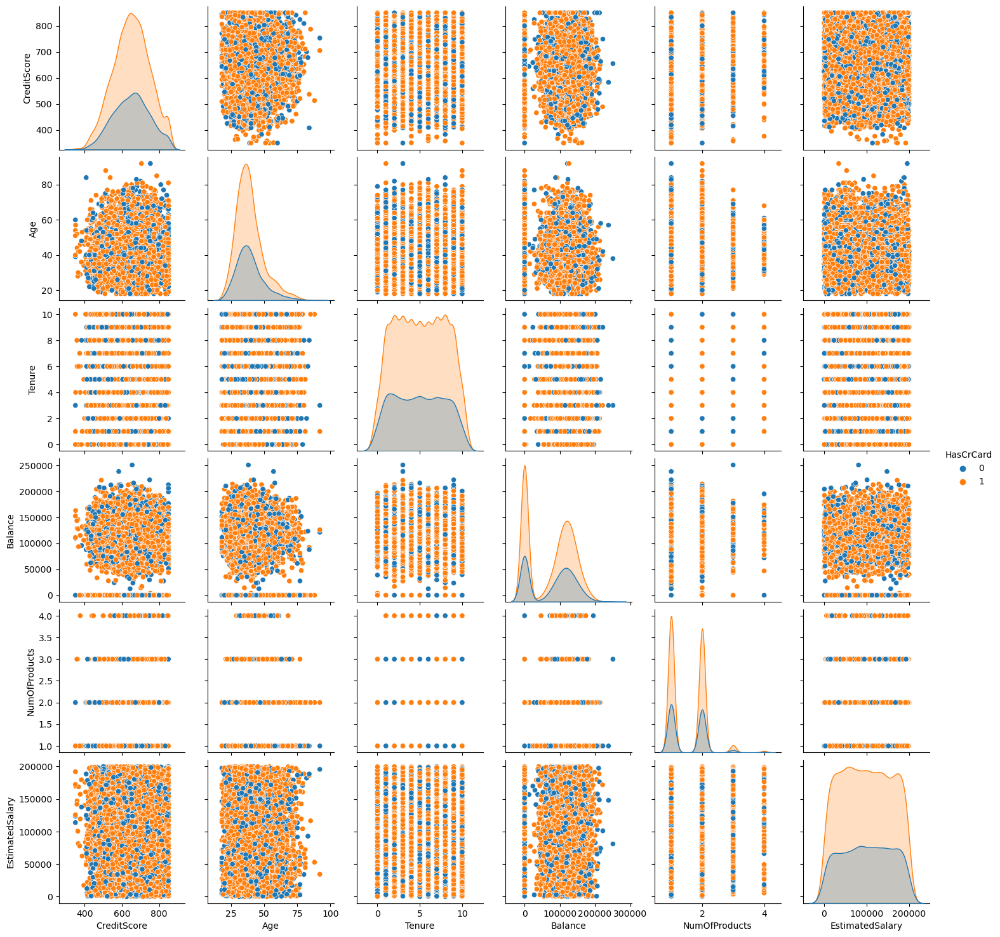

Pairplots separating for the variable:  IsActiveMember


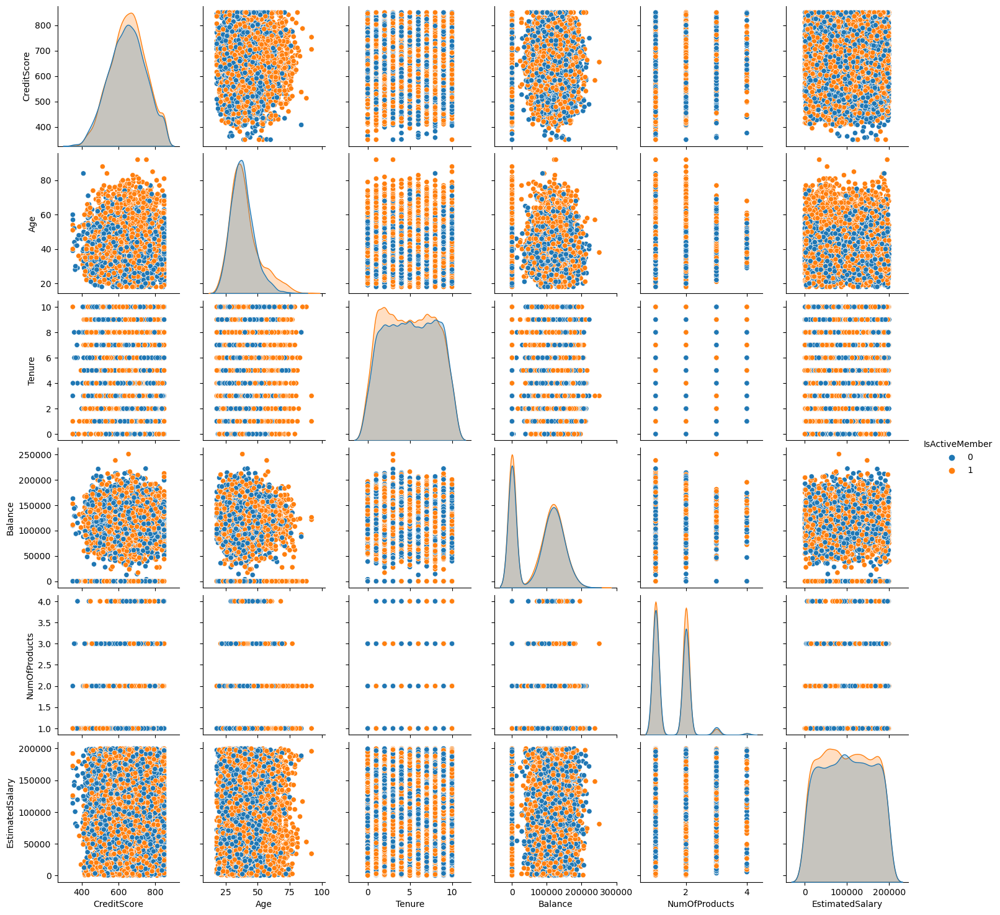

Pairplots separating for the variable:  Exited


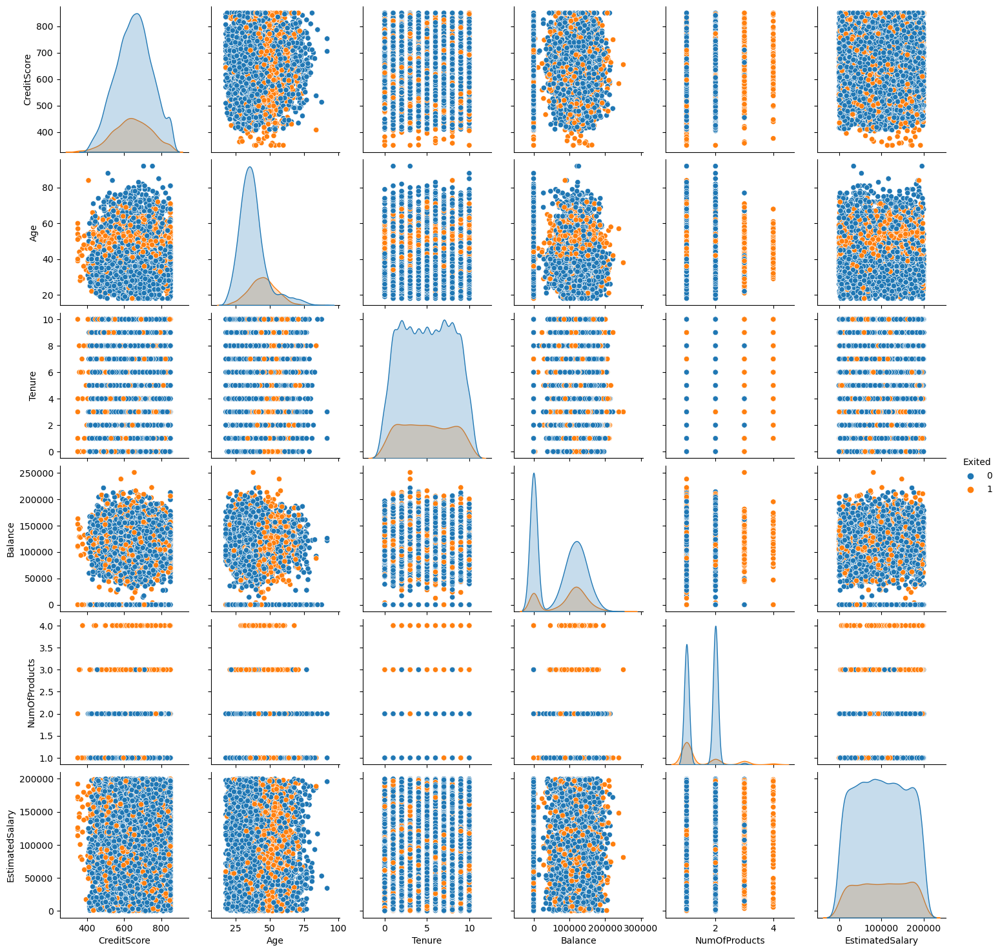

In [10]:
for col in bank_data.select_dtypes(include='category').columns:
    print('Pairplots separating for the variable: ', col)
    sub_df = bank_data.select_dtypes(include=np.number)
    sub_df[col] = bank_data[col]
    sns.pairplot(sub_df, hue=col)
    plt.show()

### Comments:

We see that most of the bivariate plots do not provide a lot of information. However, we can see that grouping values based on whether or not the customers exited cluster out between various variables. 
- Most of the customers that exited had 3 or 4 products
- They are between the ages of 40 and 60

## Preparing the data for modeling

In [11]:
X = bank_data.drop(columns='Exited')
y = bank_data['Exited']

print(np.shape(X),np.shape(y))
y.head()

(10000, 10) (10000,)


0    1
1    0
2    1
3    0
4    0
Name: Exited, dtype: category
Categories (2, int64): [0, 1]

In [12]:
#Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 1,stratify = y)

In [13]:
for cat_col in X_train.select_dtypes(include='category').columns:
    labelencoder = LabelEncoder()
    X_train[cat_col]= labelencoder.fit_transform(X_train[cat_col])
    X_test[cat_col]= labelencoder.transform(X_test[cat_col])
   
#Normalizing the input features using MinMaxScaler
normal = MinMaxScaler()
X_norm_train = pd.DataFrame(normal.fit_transform(X_train), columns=X_train.columns)
X_norm_test = pd.DataFrame(normal.fit_transform(X_test), columns=X_test.columns)

###Checking the shape of train and test sets
print(X_norm_train.shape)
print(X_norm_test.shape)
print(y_train.shape)
print(y_test.shape)

(8000, 10)
(2000, 10)
(8000,)
(2000,)


In [14]:
X_norm_train.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,0.492,1.0,0.0,0.783784,0.9,0.534911,0.000000,1.0,1.0,0.067226
1,0.528,0.0,1.0,0.418919,0.1,0.000000,0.333333,1.0,0.0,0.962237
2,0.190,1.0,1.0,0.594595,0.1,0.255559,0.000000,1.0,1.0,0.382827
3,0.388,0.0,0.0,0.297297,0.7,0.000000,0.000000,0.0,1.0,0.805404
4,0.792,0.0,1.0,0.256757,0.2,0.000000,0.333333,1.0,0.0,0.715981


### Training network with SGD optimizer

In [15]:
# Initializing the ANN
model = Sequential()
# The amount of nodes (dimensions) in hidden layer should be the average of input and output layers, in this case 64.
# This adds the input layer (by specifying input dimension) AND the first hidden layer (units)
model.add(Dense(activation = 'relu', input_dim = 10, units=6))
#Add 1st hidden layer
model.add(Dense(units=6, activation='relu'))
# Adding the output layer
model.add(Dense(units=1, activation='sigmoid'))

# Create optimizer with default learning rate
# Compile the model
model.compile(optimizer='SGD', loss='binary_crossentropy', metrics=['accuracy'])


In [16]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 6)                 66        
                                                                 
 dense_1 (Dense)             (None, 6)                 42        
                                                                 
 dense_2 (Dense)             (None, 1)                 7         
                                                                 
Total params: 115
Trainable params: 115
Non-trainable params: 0
_________________________________________________________________


In [17]:
history=model.fit(X_norm_train, y_train,           
          validation_split=0.2,
          epochs=50,
          batch_size=32,verbose=1)

Epoch 1/50
200/200 [==============================] - 1s 4ms/step - loss: 0.5694 - accuracy: 0.7977 - val_loss: 0.5134 - val_accuracy: 0.7906
Epoch 2/50
200/200 [==============================] - 0s 2ms/step - loss: 0.4960 - accuracy: 0.7977 - val_loss: 0.4998 - val_accuracy: 0.7906
Epoch 3/50
200/200 [==============================] - 0s 2ms/step - loss: 0.4906 - accuracy: 0.7977 - val_loss: 0.4983 - val_accuracy: 0.7906
Epoch 4/50
200/200 [==============================] - 0s 2ms/step - loss: 0.4891 - accuracy: 0.7977 - val_loss: 0.4974 - val_accuracy: 0.7906
Epoch 5/50
200/200 [==============================] - 0s 2ms/step - loss: 0.4879 - accuracy: 0.7977 - val_loss: 0.4959 - val_accuracy: 0.7906
Epoch 6/50
200/200 [==============================] - 0s 2ms/step - loss: 0.4865 - accuracy: 0.7977 - val_loss: 0.4945 - val_accuracy: 0.7906
Epoch 7/50
200/200 [==============================] - 0s 2ms/step - loss: 0.4852 - accuracy: 0.7977 - val_loss: 0.4936 - val_accuracy: 0.7906
Epoch 

63/63 [==============================] - 0s 1ms/step - loss: 0.4274 - accuracy: 0.8205


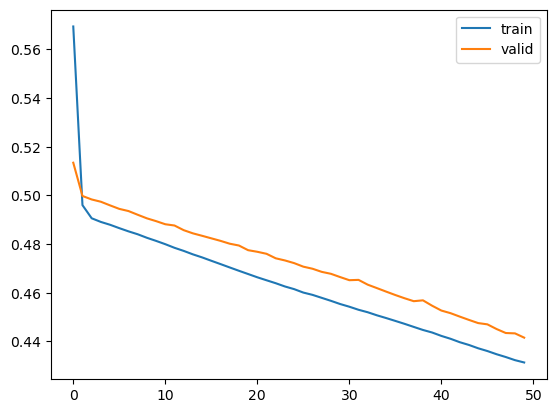

In [18]:
# Capturing learning history per epoch
hist  = pd.DataFrame(history.history)
hist['epoch'] = history.epoch

# Plotting accuracy at different epochs
plt.plot(hist['loss'])
plt.plot(hist['val_loss'])
plt.legend(("train" , "valid") , loc =0)

#Printing results
results = model.evaluate(X_norm_test, y_test)

In [19]:
y_pred=model.predict(X_norm_test)
y_pred = (y_pred > 0.5)

63/63 [==============================] - 0s 1ms/step


In [20]:
def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.
    Arguments
    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))



    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.heatmap(cf,annot=box_labels,fmt="",cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories)

    
    if title:
        plt.title(title)

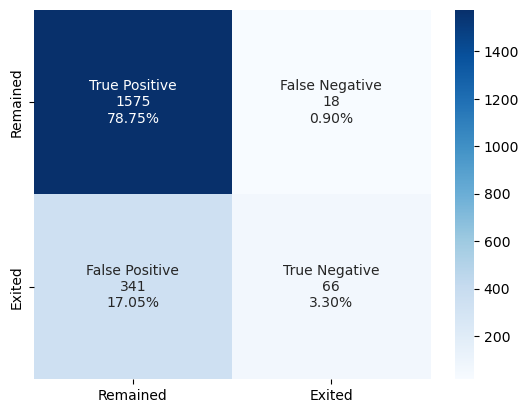

In [21]:
#Calculating the confusion matrix 
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(y_test, y_pred)
labels = ['True Positive','False Negative','False Positive','True Negative']
categories = [ 'Remained','Exited']
make_confusion_matrix(cm, 
                      group_names=labels,
                      categories=categories, 
                      cmap='Blues')

In [22]:
#Accuracy as per the classification report 
from sklearn import metrics
cr=metrics.classification_report(y_test,y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.82      0.99      0.90      1593
           1       0.79      0.16      0.27       407

    accuracy                           0.82      2000
   macro avg       0.80      0.58      0.58      2000
weighted avg       0.81      0.82      0.77      2000



63/63 [==============================] - 0s 2ms/step
Best Threshold=1.000000, G-Mean=0.000


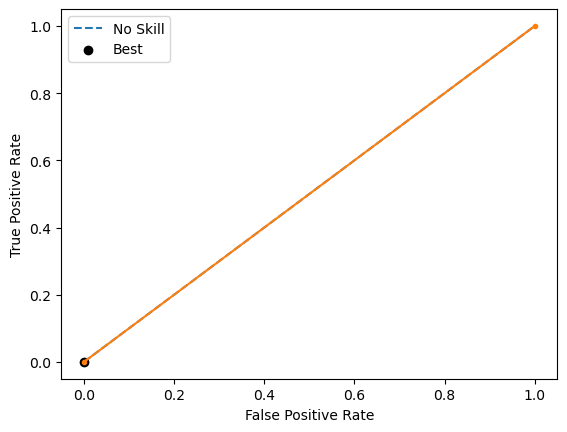

In [34]:
from sklearn.metrics import roc_curve

from matplotlib import pyplot


# predict probabilities
yhat = model.predict(X_test)
# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_test, yhat)
# calculate the g-mean for each threshold
gmeans1 = np.sqrt(tpr * (1-fpr))
# locate the index of the largest g-mean
ix = np.argmax(gmeans1)
print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans1[ix]))
# plot the roc curve for the model
pyplot.plot([0,1], [0,1], linestyle='--', label='No Skill')
pyplot.plot(fpr, tpr, marker='.')
pyplot.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.legend()
# show the plot
pyplot.show()

### Using adam as Optimizer

In [24]:
backend.clear_session()
# Initializing the ANN
model2 = Sequential()
# The amount of nodes (dimensions) in hidden layer should be the average of input and output layers, in this case 64.
# This adds the input layer (by specifying input dimension) AND the first hidden layer (units)
model2.add(Dense(activation = 'relu', input_dim = 10, units=6))
#Add 1st hidden layer
model2.add(Dense(units=6, activation='relu'))
# Adding the output layer
model2.add(Dense(units=1, activation='sigmoid'))

# Create optimizer with default learning rate
# Compile the model
model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [25]:
history2=model2.fit(X_norm_train, y_train,           
          validation_split=0.2,
          epochs=50,
          batch_size=32,verbose=1)

Epoch 1/50
200/200 [==============================] - 1s 3ms/step - loss: 3999.3000 - accuracy: 0.4991 - val_loss: 103.3130 - val_accuracy: 0.6481
Epoch 2/50
200/200 [==============================] - 0s 2ms/step - loss: 49.9721 - accuracy: 0.6866 - val_loss: 29.6169 - val_accuracy: 0.7800
Epoch 3/50
200/200 [==============================] - 0s 2ms/step - loss: 21.2082 - accuracy: 0.6897 - val_loss: 18.0601 - val_accuracy: 0.7812
Epoch 4/50
200/200 [==============================] - 0s 2ms/step - loss: 16.5048 - accuracy: 0.6925 - val_loss: 20.1140 - val_accuracy: 0.7700
Epoch 5/50
200/200 [==============================] - 0s 2ms/step - loss: 11.4868 - accuracy: 0.6612 - val_loss: 13.8640 - val_accuracy: 0.7544
Epoch 6/50
200/200 [==============================] - 0s 2ms/step - loss: 12.1006 - accuracy: 0.6766 - val_loss: 19.0884 - val_accuracy: 0.4850
Epoch 7/50
200/200 [==============================] - 0s 2ms/step - loss: 12.5383 - accuracy: 0.6741 - val_loss: 11.9796 - val_accura

63/63 [==============================] - 0s 3ms/step - loss: 0.6212 - accuracy: 0.7965


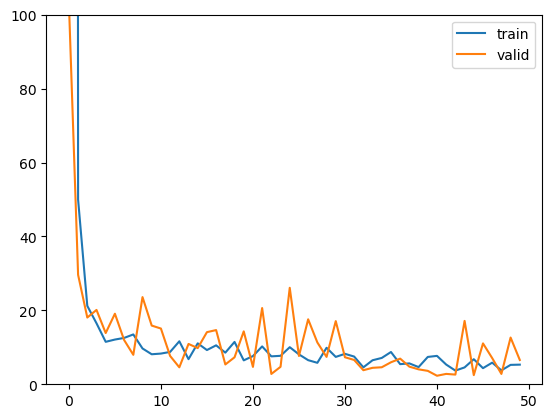

In [43]:
# Capturing learning history per epoch
hist  = pd.DataFrame(history2.history)
hist['epoch'] = history2.epoch

# Plotting accuracy at different epochs
plt.plot(hist['loss'])
plt.plot(hist['val_loss'])
plt.legend(("train" , "valid") , loc =0)
plt.ylim([0, 100])

#Printing results
results = model2.evaluate(X_norm_test, y_test)

In [36]:
y_pred2=model2.predict(X_norm_test)
y_pred2 = (y_pred2 > 0.5)

63/63 [==============================] - 0s 2ms/step


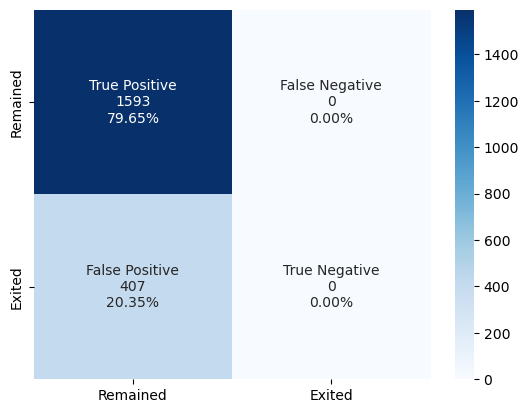

In [37]:
#Calculating the confusion matrix 
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(y_test, y_pred2)
labels = ['True Positive','False Negative','False Positive','True Negative']
categories = [ 'Remained','Exited']
make_confusion_matrix(cm, 
                      group_names=labels,
                      categories=categories, 
                      cmap='Blues')

63/63 [==============================] - 0s 2ms/step
Best Threshold=0.419939, G-Mean=0.430


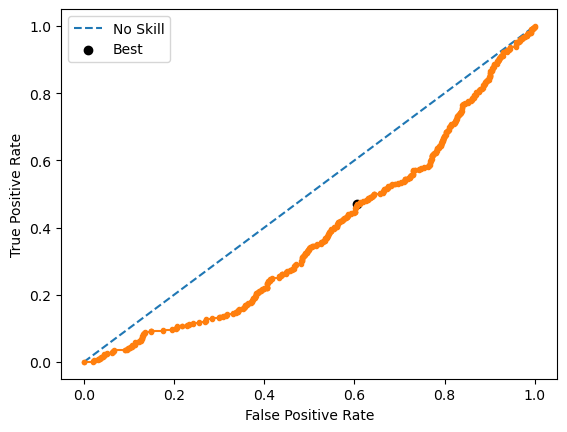

In [41]:
from sklearn.metrics import roc_curve

from matplotlib import pyplot


# predict probabilities
yhat2 = model2.predict(X_norm_test)
# calculate roc curves
fpr, tpr, thresholds2 = roc_curve(y_test, yhat2)
# calculate the g-mean for each threshold
gmeans1 = np.sqrt(tpr * (1-fpr))
# locate the index of the largest g-mean
ix = np.argmax(gmeans1)
print('Best Threshold=%f, G-Mean=%.3f' % (thresholds2[ix], gmeans1[ix]))
# plot the roc curve for the model
pyplot.plot([0,1], [0,1], linestyle='--', label='No Skill')
pyplot.plot(fpr, tpr, marker='.')
pyplot.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.legend()
# show the plot
pyplot.show()

We see that the network preforms worse when using Adam as an optimizer, accuracy slightly decreasing. However, the valid loss is very noisy for the adam optimizer, while the SGD optimizer smoothly decreased.

### Predicting the results using best as a threshold
We can attempt to find the threshold and see if the performance can perform. However, observing the resulting ROC curves, it will be likely not the case

63/63 [==============================] - 0s 1ms/step


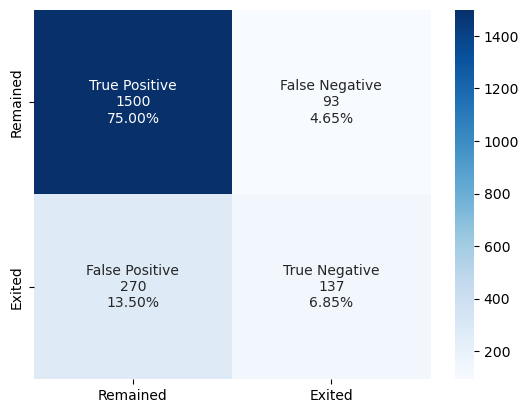

In [30]:
y_pred_e1=model.predict(X_norm_test)
y_pred_e1 = (y_pred_e1 > thresholds[ix])

#Calculating the confusion matrix 
cm1=confusion_matrix(y_test, y_pred_e1)
labels = ['True Positive','False Negative','False Positive','True Negative']
categories = [ 'Remained','Exited']
make_confusion_matrix(cm1, 
                      group_names=labels,
                      categories=categories, 
                      cmap='Blues')

63/63 [==============================] - 0s 2ms/step


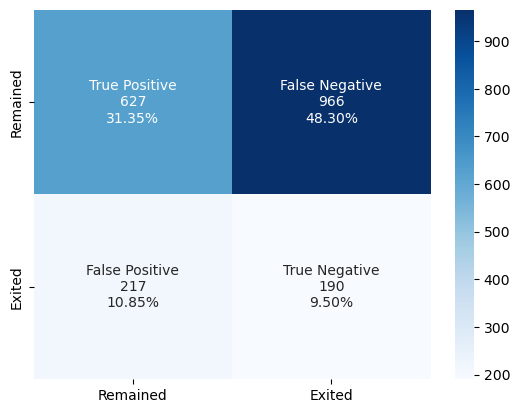

In [39]:
#Predicting the results using best as a threshold
y_pred_e2=model2.predict(X_norm_test)
y_pred_e2 = (y_pred_e2 > thresholds2[ix])

#Calculating the confusion matrix 
cm2=confusion_matrix(y_test, y_pred_e2)
labels = ['True Positive','False Negative','False Positive','True Negative']
categories = [ 'Remained','Exited']
make_confusion_matrix(cm2, 
                      group_names=labels,
                      categories=categories, 
                      cmap='Blues')

As was predicted, threshold selection did not help accuracy values.

### Using GridSearch CV Optimizer

In [52]:
backend.clear_session()

# Defining the ANN model
def create_model(learning_rate, neurons, hidden_layers, activation, dropout_rate, batch_size):
    model = Sequential()
    for i in range(hidden_layers):
        if i == 0:
            model.add(Dense(neurons, input_dim=X_norm_train.shape[1], activation=activation))
        else:
            model.add(Dense(neurons, activation=activation))
        model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))
    optimizer = tf.keras.optimizers.SGD(lr=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create a KerasClassifier for use in scikit-learn's GridSearchCV
model = KerasClassifier(build_fn=create_model, verbose=0)

# Define the hyperparameters to search over
param_grid = {
    'learning_rate': [0.0001, 0.001, 0.01],
    'neurons': [10, 50, 100],
    'hidden_layers': [1, 2, 3],
    'activation': ['sigmoid', 'tanh', 'relu'],
    'dropout_rate': [0.1, 0.3, 0.5],
    'batch_size':[32, 64, 128],
}

# Use GridSearchCV to find the optimal hyperparameters
GridSearch = GridSearchCV(estimator=model, param_grid=param_grid, cv=3)
GS_result = GridSearch.fit(X_norm_train, y_train)

In [53]:
# Summarize results
print("Best: %f using %s" % (GS_result.best_score_, GS_result.best_params_))
means = GS_result.cv_results_['mean_test_score']
stds = GS_result.cv_results_['std_test_score']
params = GS_result.cv_results_['params']

Best: 0.796499 using {'activation': 'tanh', 'batch_size': 32, 'dropout_rate': 0.1, 'hidden_layers': 2, 'learning_rate': 0.01, 'neurons': 10}


In [57]:
estimator_GS=create_model(
    neurons=GS_result.best_params_['neurons'],
    learning_rate=GS_result.best_params_['learning_rate'],
    activation=GS_result.best_params_['activation'],
    dropout_rate=GS_result.best_params_['dropout_rate'],
    hidden_layers=GS_result.best_params_['hidden_layers'],
    batch_size=GS_result.best_params_['batch_size'],
)

estimator_GS.summary()

Model: "sequential_2189"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6567 (Dense)          (None, 10)                110       
                                                                 
 dropout_4378 (Dropout)      (None, 10)                0         
                                                                 
 dense_6568 (Dense)          (None, 10)                110       
                                                                 
 dropout_4379 (Dropout)      (None, 10)                0         
                                                                 
 dense_6569 (Dense)          (None, 1)                 11        
                                                                 
Total params: 231
Trainable params: 231
Non-trainable params: 0
_________________________________________________________________


In [59]:
optimizer = tf.keras.optimizers.SGD(GS_result.best_params_['learning_rate'])
estimator_GS.compile(loss='binary_crossentropy',optimizer=optimizer,metrics=['accuracy'])
history3=estimator_GS.fit(X_norm_train, y_train, 
                        epochs=50, 
                        verbose=1,
                        validation_split=0.2,
                        batch_size=GS_result.best_params_['batch_size'],
                          )

Epoch 1/50
200/200 [==============================] - 2s 5ms/step - loss: 0.5278 - accuracy: 0.7861 - val_loss: 0.5050 - val_accuracy: 0.7906
Epoch 2/50
200/200 [==============================] - 1s 3ms/step - loss: 0.5042 - accuracy: 0.7962 - val_loss: 0.4975 - val_accuracy: 0.7906
Epoch 3/50
200/200 [==============================] - 1s 3ms/step - loss: 0.4949 - accuracy: 0.7964 - val_loss: 0.4921 - val_accuracy: 0.7906
Epoch 4/50
200/200 [==============================] - 1s 3ms/step - loss: 0.4881 - accuracy: 0.7975 - val_loss: 0.4891 - val_accuracy: 0.7906
Epoch 5/50
200/200 [==============================] - 1s 3ms/step - loss: 0.4884 - accuracy: 0.7970 - val_loss: 0.4855 - val_accuracy: 0.7906
Epoch 6/50
200/200 [==============================] - 1s 3ms/step - loss: 0.4872 - accuracy: 0.7962 - val_loss: 0.4829 - val_accuracy: 0.7906
Epoch 7/50
200/200 [==============================] - 1s 3ms/step - loss: 0.4826 - accuracy: 0.7972 - val_loss: 0.4816 - val_accuracy: 0.7906
Epoch 

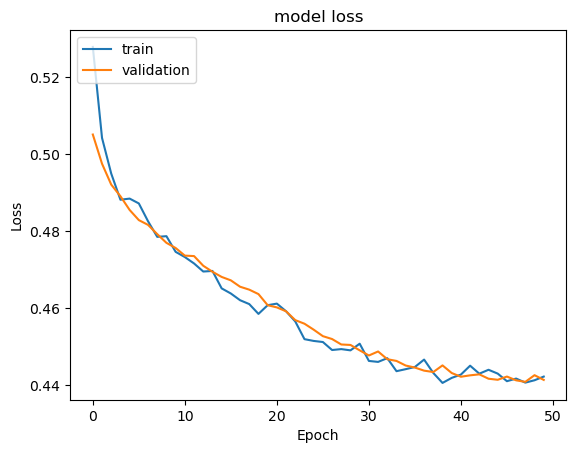

In [60]:
#Plotting Train Loss vs Validation Loss
plt.plot(history3.history['loss'])
plt.plot(history3.history['val_loss'])
plt.title('model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

63/63 [==============================] - 0s 2ms/step
Best Threshold=0.346204, G-Mean=0.554


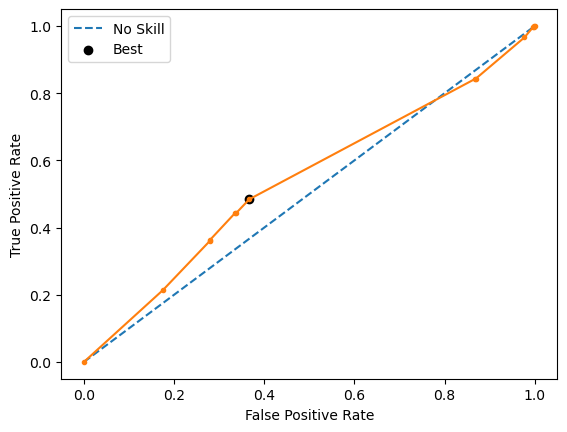

In [61]:
# predict probabilities
yhat3 = estimator_GS.predict(X_test)

# calculate roc curves
fpr, tpr, thresholds5 = roc_curve(y_test, yhat3)
# calculate the g-mean for each threshold
gmeans3 = np.sqrt(tpr * (1-fpr))
# locate the index of the largest g-mean
ix = np.argmax(gmeans3)
print('Best Threshold=%f, G-Mean=%.3f' % (thresholds5[ix], gmeans3[ix]))
# plot the roc curve for the model
pyplot.plot([0,1], [0,1], linestyle='--', label='No Skill')
pyplot.plot(fpr, tpr, marker='.')
pyplot.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.legend()
# show the plot
pyplot.show()

In [62]:
y_pred_e3=estimator_GS.predict(X_test)
y_pred_e3 = (y_pred_e3 > thresholds5[ix])

63/63 [==============================] - 0s 2ms/step


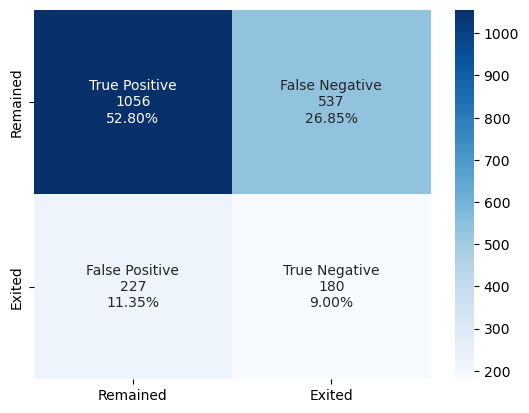

In [63]:
#Calculating the confusion matrix 

cm=confusion_matrix(y_test, y_pred_e3)
labels = ['True Positive','False Negative','False Positive','True Negative']
categories = [ 'Remained','Exited']
make_confusion_matrix(cm, 
                      group_names=labels,
                      categories=categories, 
                      cmap='Blues')

In [64]:
#Accuracy as per the classification report 

cr=metrics.classification_report(y_test,y_pred_e3)
print(cr)

              precision    recall  f1-score   support

           0       0.82      0.66      0.73      1593
           1       0.25      0.44      0.32       407

    accuracy                           0.62      2000
   macro avg       0.54      0.55      0.53      2000
weighted avg       0.71      0.62      0.65      2000



### Business Recommendations
While the SGD optimizer gave the best performance, it resulted in really low Recall scores. By using a GridSearchCV we were able to obtain a model that averages performance for Accuracy.

This model could be deployed to have a fairly good prediction over whether or not a client would leave the bank.

Given the small number of observations, the strength of using an ANN become lost and a better model could be reached by simpler predictive models or oven ensemble techniques. 